# Sentiment analysis & topic modeling of antidepressant drug reviews using transfomers & BERTopic

## Introduction

In this notebook we will analyze drug reviews using transformer models. More specifically, we will perform sentiment analysis on drug reviews for antidepressants using the DistilBERT language model in the first part of our analysis. In the second part we will use BERTopic to perform transformer- and c-TF-IDF- based topic modeling of drug reviews for antidepressants. For this part we will use the distilRoBERTa language model to embed the drug reviews.

## Data Preprocessing

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import glob
import pickle

import textwrap
wrapper = textwrap.TextWrapper(width=80)

from bertopic import BERTopic
from bertopic.vectorizers import ClassTfidfTransformer
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from transformers import AutoTokenizer, pipeline, DistilBertForSequenceClassification
from umap import UMAP
from hdbscan import HDBSCAN

import plotly.io as pio
# This ensures Plotly output works in multiple places:
# plotly_mimetype: VS Code notebook UI
# notebook: "Jupyter: Export to HTML" command in VS Code
# See https://plotly.com/python/renderers/#multiple-renderers
pio.renderers.default = "plotly_mimetype+notebook"

pd.set_option('display.max_rows', 100)

%matplotlib inline

In [3]:
### Some variables and conigurations ###

# Color map for graphs
CMAP = "Set2"

# Choose whether to rerun sentiment analysis or to load prebuilt model
COMPUTE_SENTIMENT_SCORES = False

# Pre-trained language model used for performing sentiment analysis
SENTIMENT_MODEL = 'distilbert-base-uncased-finetuned-sst-2-english'

# Choose whether to rerun topic analysis or to load prebuilt model
COMPUTE_EMBEDDINGS = False

#  Pre-train language model for embedding documents when performing topic analysis
EMBEDDING_MODEL = 'all-distilroberta-v1'


### Data Import

For this analysis we will download a data set with drug reviews from Kaggle:
[https://www.kaggle.com/datasets/mohamedabdelwahabali/drugreview](https://www.kaggle.com/datasets/mohamedabdelwahabali/drugreview)

After downloading and extracting we can import the drug reviews as follows:

In [4]:
def load_reviews(file):
    # Loading data from multi-line jsonl files, so set 'lines=True'
    df = pd.read_json(file, lines=True).convert_dtypes()
    df = df.astype({col: "int32" for col in df.select_dtypes("int64").columns})
    df["drugName"] = df["drugName"].astype("category")
    df["condition"] = df["condition"].astype("category")
    df["condition"] = df["condition"].str.replace(
        "disorde", "disorder" # Correct typo in data set
    )
    df.rename(
        columns={"usefulCount": "useful_count", "drugName": "drug_name"}, inplace=True
    )
    df.set_index("patient_id", inplace=True)
    print(f"Number of reviews in {file}:", df.shape[0])
    return df


In [5]:
data_df = pd.concat([load_reviews(f) for f in glob.glob("*.jsonl")])
print(f"\n{data_df.shape[0]} drug reviews imported")


Number of reviews in drug_review_test.jsonl: 46108
Number of reviews in drug_review_validation.jsonl: 27703
Number of reviews in drug_review_train.jsonl: 110811

184622 drug reviews imported


It seems the raw data sets contain duplicate reviews, because some reviews are included twice with both brand and compound name. See for example the following reviews, retrieved with a randomly selected review snippet.

In [6]:
!grep "i have been on brintellix for 6 months\." drug_review_train.jsonl | jq '.'

{
  "patient_id": 94112,
  "drugName": "Trintellix",
  "condition": "depression",
  "review": "\"i have been on brintellix for 6 months. started on 10mg. initially like everyone else thought it was great with the exception of nausea. it also helped with the quality of my sleep. after about a month it plataued so i went up to 20 mg but it made me extremely tired so i went back down to 10 mg. 5 months into taking this ridiculously expensive drug i felt my personality is completely changing and not for the better.  i became quick to anger, on the verge of tears, (not typical for me), with an explosive and unpredictable personality.  if that was not enough i was also very tired all the time. the personality changes cost me my job and at home well, it hurt people that i love.  going off of it i was in pain and tears for days...\"",
  "rating": 3,
  "date": "March 1, 2016",
  "usefulCount": 58,
  "review_length": 142
}
{
  "patient_id": 93133,
  "drugName": "Vortioxetine",
  "condition": "de

We can see that both reviews are exactly the same, except for drug name, which is the brand name "Trintellix" in one case and compound name "Vortioxetine" in the other case. So, we will remove those duplicate reviews. We will still normalize brand and compound names later, so for the moment it does not matter which reviews of duplicate pairs are getting removed.

In [7]:
total_reviews = data_df.shape[0]
data_df.drop_duplicates(inplace=True, subset=['review'])
percentage = (data_df.shape[0] / total_reviews ) * 100
print(f"\n{data_df.shape[0]} unique reviews found ({percentage:.2f}% of total reviews)")


110903 unique reviews found (60.07% of total reviews)


After duplicate removal, 110903 unique reviews of 184622 total reviews are kept. This amounts to 60% percentage of reviews that are being preserved after duplciate removal.

We will also check whether there are any missing values in the data set. This seems not to be the case.

In [8]:
print('Number of missing values in data frame:\n', data_df.isna().sum(), sep='')


Number of missing values in data frame:
drug_name        0
condition        0
review           0
rating           0
date             0
useful_count     0
review_length    0
dtype: int64


After we have succesfully imported the data set, the resulting data frame looks as follows:

In [9]:
data_df.head()

,drug_name,condition,review,rating,date,useful_count,review_length
patient_id,,,,,,,
163740,Mirtazapine,depression,"""i've tried a few antidepressants over the yea...",10,2012-02-28,22,68
206473,Mesalamine,"crohn's disease, maintenance","""my son has crohn's disease and has done very ...",8,2009-05-17,17,48
39293,Contrave,weight loss,"""contrave combines drugs that were used for al...",9,2017-03-05,35,143
97768,Cyclafem 1 / 35,birth control,"""i have been on this birth control for one cyc...",9,2015-10-22,4,149
208087,Zyclara,keratosis,"""4 days in on first 2 weeks. using on arms an...",4,2014-07-03,13,60


### Extract reviews for antidepressant drugs

Because the aim of this analysis is to perform sentiment analysis and topic modeling on antidepressant drug reviews, we will start by filtering reviews about antidepressants. After filtering, we still have 10888 reviews about antidepressants (5,9% from the total number of reviews)

In [10]:
ad_df = data_df[data_df.condition.str.contains("depression", regex=True, na=False)]
ad_df.shape

print(
      "%s reviews found for antidepressants (%.2f%% of total) "
      % (ad_df.shape[0], (ad_df.shape[0] / data_df.shape[0]) * 100)
)


6370 reviews found for antidepressants (5.74% of total) 


Because topic models work best when there are enough documents per topic (i.e. drug), we will further narrow down the selected used antidepressants to include only those antidepressants having more than 100 reviews. So we will start by retrieving a list with the most commonly used antidepressant drugs.

Note though that the data set still contains both antidepressant brand names and active compounds. So we will still need to normalize drug names. We will therefore create dictionaries to map brands to compounds and vice versa, which we can then use to normalize drug names.

In [11]:
brand2compound_dict = {
    "Abilify": "Aripiprazole",
    "Celexa": "Citalopram",
    "Cymbalta": "Duloxetine",
    "Effexor": "Venlafaxine",
    "Effexor XR": "Venlafaxine",
    "Lexapro": "Escitalopram",
    "Mirtazapine": "Mirtazapine",
    "Paxil": "Paroxetine",
    "Pristiq": "Desvenlafaxine",
    "Prozac": "Fluoxetine",
    "Remeron": "Mirtazapine",
    "Trintellix": "Vortioxetine",
    "Viibryd": "Vilazodone",
    "Wellbutrin": "Bupropion",
    "Wellbutrin XL": "Bupropion",
    "Zoloft": "Sertraline",
}

Since reviews are written by customers, those reviews are probaby more likely to contain brand names rather than compond names, so we will also create a dictionary to map compound names back to brand names, which we will use to normalize brand names for antidepressants.

In [12]:
compound2brand_dict = dict((v,k) for k,v in brand2compound_dict.items())
compound2brand_dict["Venlafaxine"] = "Effexor"
compound2brand_dict["Effexor XR"] = "Effexor"
compound2brand_dict["Mirtazapine"] = "Remeron"
compound2brand_dict["Bupropion"] = "Wellbutrin"
compound2brand_dict["Wellbutrin XL"] = "Wellbutrin"

In [13]:
ad_df.replace({"drug_name": compound2brand_dict}, inplace=True)

antidepressants = (
    ad_df.drug_name.value_counts()
    .reset_index(name="counts")
    .query("counts >= 100")
    .sort_values(by="index", ascending=True)["index"]
    .values.tolist()
)

(
    pd.DataFrame(antidepressants)
    .rename(columns={0: "Normalized brand names"})
    .style.hide(axis="index")
)


Normalized brand names
Abilify
Celexa
Cymbalta
Effexor
Lexapro
Paxil
Pristiq
Prozac
Remeron
Trintellix


We can see that all compound names are mapped to brand names. Now that we have normalized nanmes for the most commonly used antidepressants, let's have a look at the number of retrieved reviews per drug.

In [14]:
ad_df = ad_df[ad_df['drug_name'].isin(antidepressants)]
perc = (ad_df.shape[0] / total_reviews) * 100
print(f"{ad_df.shape[0]} reviews for commonly used antidepressants found ({perc:.2f}% of total).")

5331 reviews for commonly used antidepressants found (2.89% of total).


We can also have a look at the number of reviews per antidepressant. We can observe that all drugs indeed have more than 100 reviews.

In [15]:
print("\nReviews per antidepressant:")
pd.DataFrame(ad_df['drug_name'].value_counts()).rename(columns={'drug_name': 'Nr of Reviews'})


Reviews per antidepressant:


,Nr of Reviews
Wellbutrin,645
Zoloft,623
Pristiq,528
Effexor,512
Celexa,477
Lexapro,462
Trintellix,426
Cymbalta,380
Viibryd,368
Prozac,343


Let's also visualize this with a simple bar chart.

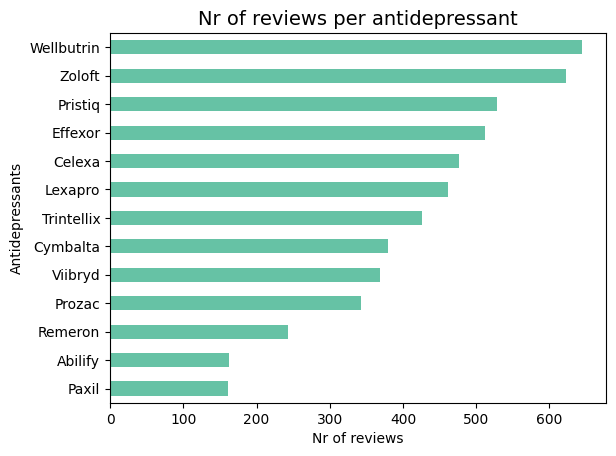

In [16]:
ax = ad_df["drug_name"].value_counts().rename().iloc[::-1].plot.barh(cmap=CMAP)

ax.set_title("Nr of reviews per antidepressant", fontsize=14)
ax.set_xlabel("Nr of reviews")
ax.set_ylabel("Antidepressants");


Now that we have performed some data preprocessing, we can proceed with the actual analyses.

## Sentiment Analysis

For this part of the analysis, we will perform sentiment analysis on the retained antidepressant reviews.  We will use a pretrained transformer model downloaded from [Huggingface](https://huggingface.co/). For this sentiment analysis we will use the [DistilBERT](https://huggingface.co/docs/transformers/model_doc/distilbert)  language model **[Sanh. et al., 2019]**. DistilBERT is is a smaller and faster language model than the original, large-scale BERT language model. DistilBERT has 40% less parameters, runs 60% faster, while keeping 95% of BERT's performance. More specifically we have used [distilbert-base-uncased-finetuned-sst-2-english](https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english), which is a pretrained distilBERT model that was fine-tuned on English, uncased text data and can be used for classification tasks and sentiment analysis.

To get started with the DistilBERT language model, we will first need to initialize a tokenizer, which will prepare the inputs for model. Note that unlike traditional NLP pipelines, no additional cleaning steps such as stop word removal, lemmatization, etc need to be performed. After initalizing the tokenizer, we will load the fine-tuned DistilBERT model from a model checkpoint. Once we have initialized both the tokenizer we can create the classifier pipeline. Because we will perform sentiment analysis we will set the parameter `task='sentiment-analysis'`. 

Also note that the reviews have different lengths, while the language model will only accept a fixed length input. Therefore we will add parameter `padding=True` which instructs the pipeline fill reviews with shorter length to a fixed size. Similarly, adding parameter `truncation=True` will instruct the pipeline to clip off reviews that have a length that is longer than the fixed size.

In [17]:
tokenizer = AutoTokenizer.from_pretrained(SENTIMENT_MODEL)
model = DistilBertForSequenceClassification.from_pretrained(SENTIMENT_MODEL)
classifier = pipeline(
    task="sentiment-analysis",
    model=model,
    tokenizer=tokenizer,
    padding=True,
    truncation=True,
)


We will also define some auxiliary functions to parse the results after running the pipeline and merge them with the previously created dataframe containing all data and annotations.

In [18]:
def parse_sentiment_results(results):
    labels = []
    scores_pos = []
    scores_neg = []
    for i, _ in enumerate(results):
        label = results[i]["label"]

        labels.append(label)
        if label == "POSITIVE":
            scores_pos.append(results[i]["score"])
            scores_neg.append(1 - results[i]["score"])
        else:
            scores_pos.append(1 - results[i]["score"])
            scores_neg.append(results[i]["score"])

    df = pd.DataFrame.from_dict(
        {"sentiment": labels, "score_pos": scores_pos, "score_neg": scores_neg}
    )
    return df


Once we have set up the pipeline and defined the auxiliary functions we are ready to run our sentiment analysis. Because this is a computationally expensive step, the output will be written to a parquet data frame after running the sentiment analysis pipeline, which subsequently can be read in for further analyses.

In [19]:
if COMPUTE_SENTIMENT_SCORES:
    results = classifier(ad_df['review'].tolist())
    sentiment_df = parse_sentiment_results(results)
    sentiment_df.index = ad_df.index.tolist()
    sentiment_df.to_parquet('sentiment.df.parquet.gzip', compression='gzip')
else:
    sentiment_df = pd.read_parquet("./sentiment.df.parquet.gzip")


Once we have the results, we can merge them with our original data frame.

In [20]:
merged_df = pd.concat([ad_df, sentiment_df], axis=1)
merged_df["compound"] = merged_df["drug_name"].replace(brand2compound_dict)
cols_reordered = merged_df.columns.insert(1, "compound")
merged_df = merged_df[cols_reordered[:-1]]
merged_df.shape


(5331, 11)

For visualization purposes, let's add some emoji symbols as well to the data frame containing all our reviews and sentiment scores.

In [21]:
HAPPY = "\U0001F642"
SAD = "\U0001F641"
STAR = "\U00002B50"

merged_df['mood'] = [HAPPY if x=="POSITIVE" else SAD for x in merged_df['sentiment'].tolist()]
merged_df['stars'] = [STAR * x for x in merged_df['rating'].tolist()]

So, after merging and adding some emoji, the merged data frame looks as follows:

In [22]:
merged_df.head(5)

,drug_name,compound,condition,review,rating,date,useful_count,review_length,sentiment,score_pos,score_neg,mood,stars
163740,Remeron,Mirtazapine,depression,"""i've tried a few antidepressants over the yea...",10,2012-02-28,22,68,NEGATIVE,0.155829,0.844171,🙁,⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐
141462,Lexapro,Escitalopram,depression,"""i am a 22 year old female college student. i ...",9,2014-04-29,32,141,POSITIVE,0.979956,0.020044,🙂,⭐⭐⭐⭐⭐⭐⭐⭐⭐
201582,Zoloft,Sertraline,depression,"""zoloft did not help me at all. i was on it f...",1,2013-01-14,51,45,NEGATIVE,0.001271,0.998729,🙁,⭐
131683,Effexor,Venlafaxine,depression,"""sadly only lasted 5 days on effexor xr. the s...",1,2016-04-24,18,130,NEGATIVE,0.000938,0.999062,🙁,⭐
122089,Effexor,Venlafaxine,depression,"""i was first prescribed effexor 13 years ago a...",8,2010-12-13,36,145,POSITIVE,0.969563,0.030437,🙂,⭐⭐⭐⭐⭐⭐⭐⭐


Now that we have annotated all reviews with sentiment label and scores, let's print a few reviews with associated sentiment values to visually inspect whether the sentiment classifier works well. We will print both the 10 most positive as well as the 10 most negative reviews.

In [23]:
def display_top_reviews(n=3, sentiment="positive"):
    cols = ["review", "stars", "rating", "mood", "sentiment", "score_pos"]
    if sentiment == "positive":
        top_df = merged_df[cols].sort_values("score_pos", ascending=False).head(n)
    else:
        top_df = merged_df[cols].sort_values("score_pos", ascending=True).head(n)

    print(f"Top {n} most {sentiment} reviews:")
    with pd.option_context(
        "display.max_columns", None,
        "display.expand_frame_repr", False,
        "max_colwidth", -1,
    ):
        display(top_df[cols].style.hide_index())


In [24]:
display_top_reviews(n=10, sentiment="positive")

Top 10 most positive reviews:


review,stars,rating,mood,sentiment,score_pos
"""i have been on brintellix for 6 months and feel amazing. i have energy and desire to be active and involved. i had noticed an improvement in my ability to concentrate and remember tasks. i love it and am so glad i feel whole.""",⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐,10,🙂,POSITIVE,0.999882
"""after years of trying to find something to work on various levels regarding my depression and anxiety, it seems that i am now being brought back to life. i feel alive again. it's amazing.""",⭐⭐⭐⭐⭐⭐⭐⭐⭐,9,🙂,POSITIVE,0.999876
"""very very good. helps a ton with energy, motivation, and joy. i was depressed for 4 years and this was just a miracle for me. highly recommend it. also, helps you last longer in bed""",⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐,10,🙂,POSITIVE,0.999871
"""the first week it wasn't too good but after it was in my system..brilliant! i am happy, in control of my emotions and back studying and being the best mum i can be ...wonderful.""",⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐,10,🙂,POSITIVE,0.999868
"""i have been taking this medicine for 6 years and am very happy with it. it is the first medication that has helped me to feel what i would guess is normal. i am able to enjoy things in my life that are good. my anxiety is less and my paranoid obsessive thoughts are much more in control. i feel like it gets my brain in the right place to where i can think clearly.""",⭐⭐⭐⭐⭐⭐⭐⭐⭐,9,🙂,POSITIVE,0.999862
"""i have taken pristiq for 2 weeks and it is starting to help my mood and energy level. i am so happy as this gives me hope that i can get back to normal.""",⭐⭐⭐⭐⭐⭐⭐⭐⭐,9,🙂,POSITIVE,0.999861
"""i am taking this medicine now and i am happy with it. i felt like a zombie the first few days but today is the start of week two and i am feeling great.""",⭐⭐⭐⭐⭐⭐⭐⭐,8,🙂,POSITIVE,0.999851
"""this medicine worked miracles for me! i absolutely love it! it is very effective and works in days, instead of weeks! when i first started taking it 40 mg i was really out of it and sleepy but i got used to it and now it gives me energy and puts me in a great mood! best anti-depressant/ anxiety medication ever and always remember there are side effects to every medicine.""",⭐⭐⭐⭐⭐⭐⭐⭐⭐,9,🙂,POSITIVE,0.999834
"""i love it i never felt this happy i will tell anybody to get on it i am calmer then ever and talkative but that's ok! i'm over the throwing up part thank god. but i love love love it!""",⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐,10,🙂,POSITIVE,0.999824
"""celexa is the best thing that has ever happened to me. i'm 16 and i have had a hard life and ever since i started taking celexa it has done nothing but the best.""",⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐,10,🙂,POSITIVE,0.999818


In [25]:
display_top_reviews(n=10, sentiment="negative")

Top 10 most negative reviews:


review,stars,rating,mood,sentiment,score_pos
"""worst medication i've ever taken. experienced every side effect except sudden death and compulsive gambling. started to feel like a zombie devoid of anything real. if you're not psychotic, don't take this!!!""",⭐,1,🙁,NEGATIVE,0.000188
"""do not take!!! this medication ruined my life in the space of a month! it made me more depressed, agitated, irritable, lose my appetite, anxious beyond belief.... and that's only on the lowest dose! i cannot believe, in all my experience with depression, that an 'antidepressant' can make someone feel so depressed.""",⭐,1,🙁,NEGATIVE,0.000190
"""i think this ad needs to be reformulated. the early upset stomach and headaches are awful there does not seem to be any real lift from depression but a muting of your emotions. i just feel flat and listless.""",⭐⭐,2,🙁,NEGATIVE,0.000191
"""i'm on day 3 of zoloft i think i'm going to stop i feel angry more depressed no motivation to do anything, feel like i can't handle my kids. super dizzy and over it like 10x more suicidal then i've ever been. also kind of feel numb and like i can't think properly. not a good feeling and i don't think its worth waiting it out...""",⭐⭐,2,🙁,NEGATIVE,0.000192
"""i was not happy about this drug at all. it made me feel so lazy and tired. zero effect on my mood; in fact, i was in a worse mood since i had zero energy.""",⭐⭐,2,🙁,NEGATIVE,0.000196
"""this drug is dangerous. the side effects are horrible and the withdrawal process to get off of the drug is arguably worse, if that is even possible. this drug should be taken off the market.""",⭐,1,🙁,NEGATIVE,0.000200
"""i've been taking abilify on and off for about eight years. i feel so flat. i use to be a go getter not anymore. i feel lazy with the abilify and lamictal combo. what should i do. i feel emotionally flat and people say i look lifeless.""",⭐⭐⭐⭐⭐⭐,6,🙁,NEGATIVE,0.000203
"""i was given the generic after taking pristiq for 5 years, this does not work for me at all, depression, anxiety and thoughts are all over the place. bennett taking the generic 2 months. have to try something else now because this is not good.""",⭐⭐,2,🙁,NEGATIVE,0.000203
"""my doctor switched me from being on zoloft for 2+years for anxiety/ depression, cause it stopped working. though it was rough to come off 150 mg dose of zoloft onto 5mg trintillix to current dose of 10 mg, my depression symptoms have mostly gone away. but as soon as i started 10 mg dose, i felt nauseated every time after taking it. after 1 week on 10mg, told my doctor about the nausea, she said the benefits outweighed the side effects, to give it more time. 2 months later, nausea is so bad,i feel like trash! it doesn't matter if i take it with/ without food, or the time of day i take it, it makes me nauseous all the time and vomit on several occasions. i also get severe acid reflux, so i'm about to quit this med, it's not worth it!""",⭐⭐,2,🙁,NEGATIVE,0.000208
"""i have been on cymbalta for about 6 months. in this time i lost my libido completely, suffered night sweats and couldn't work out if i was hot or cold during the day. i constantly felt sick both in my head and my stomach and suffered a general loss of energy, probably due to the crazy dreams and loss of sleep. i decided to quit cymbalta cold turkey, and suffered major brain zaps and a general feeling of unwellness. the worst thing was, i didn't realise this is why i felt so sick and it was impossible to find a doctor who would take my symptoms seriously. none of them knew anything about the drug either. i had to work it out for myself. i've lost several months trying to work out why i always feel sick.""",⭐,1,🙁,NEGATIVE,0.000221


The sentiment classifier seems to work well for both positive and negative reviews, so let's tabulate and plot the percentage of positive and negative reviews per antidepressant.

In [26]:
counts_df = (
    merged_df.groupby(["drug_name", "sentiment"]).size().reset_index(name="counts")
)

counts_df["group_percentage"] = 100 * (
    counts_df["counts"] / counts_df.groupby("drug_name")["counts"].transform("sum")
)
counts_df.style.hide_index()


drug_name,sentiment,counts,group_percentage
Abilify,NEGATIVE,99,60.736196
Abilify,POSITIVE,64,39.263804
Celexa,NEGATIVE,270,56.603774
Celexa,POSITIVE,207,43.396226
Cymbalta,NEGATIVE,250,65.789474
Cymbalta,POSITIVE,130,34.210526
Effexor,NEGATIVE,356,69.531250
Effexor,POSITIVE,156,30.468750
Lexapro,NEGATIVE,253,54.761905
Lexapro,POSITIVE,209,45.238095


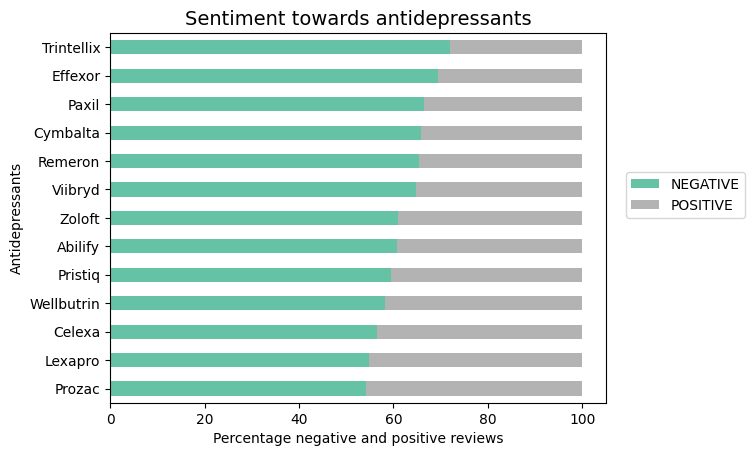

In [27]:
ax = (
    counts_df.pivot(index="drug_name", columns="sentiment", values="group_percentage")
    .sort_values("NEGATIVE", ascending=True)
    .plot.barh(stacked=True, cmap=CMAP)
)

ax.set_title("Sentiment towards antidepressants", fontsize=14)
ax.set_xlabel("Percentage negative and positive reviews")
ax.set_ylabel("Antidepressants")

plt.legend(loc=(1.04, 0.5));


## Transformer-based topic modeling with BERTopic

For the second part of this analysis we will apply deep learning-based topic modeling using [BERTopic](https://maartengr.github.io/BERTopic/index.html) **[Grootenhorst, 2022]**. More specifically, we will apply deep learning based topic modeling on reviews of antidepressant drugs to see whether we can extract side efects for each antidepressant drug. The idea is that each antidepressant will get modeled as a separate topic. Drug reviews then are the documents that will get attributed to the different topics. In case there are side effects that are frequently mentioned in the drug reviews those side effects should get picked up by the topic model. 

### Introducing BERTopic

So what is BERTopic actually? 

The following quote taken from the [BERTopic homepage](https://maartengr.github.io/BERTopic/index.html) summarizes BERTopic very well:

> BERTopic is a topic modeling technique that leverages 🤗 transformers and c-TF-IDF to create dense clusters allowing for easily interpretable topics whilst keeping important words in the topic descriptions

Furthermore, the BERTopic website provides [a nice, dedicated page that describes the underlying algorithm](https://maartengr.github.io/BERTopic/algorithm/algorithm.html#visualize-topics) that BERtopic uses to perform topic modeling.

On a high level, the BERTopic algorithm comprises a sequence of processing steps to perform topic modeling. Those steps are outlined below. 



### Overview of the BERTopic workflow


1. **Embedding Extraction:**
    In the first step, words are converted into numerical representations by using word embeddings. Although there are several embedding options, the default option is to use BERT embeddings.

2. **Dimensionality Reduction:**
    In the second step, some dimensionality reduction technique is applied to map the high-dimensional word embeddings to a lower-dimnsional structure. This lower-dimensional output subsequently can then be used as input for the clustering algorithm. Although several dimensionality reduction algorithms are available, the default algorithm used by BERTopic is [Uniform Manifold Approximation and Projection (UMAP)](https://github.com/lmcinnes/umap).**[McInnes, 2018]**

3. **Clustering:** 
    In the next step documents with similar topics are clustered together such that we can find the topics within these clusters.

4. **Count vectorizer:** 
    All documents whithin each cluster found in the previous step are seen as a separate category and are joined together. Subsequently, BERTopic computes term frequencies.

5. **c-TF-IDF:**
    To compare the importance of words between documents, BERTopic will compute a class-based term frequency–inverse document frequency (TF-IDF) score using the term frequences found in the previous stage. This class-based TF-IDF is coined c-TF-IDF and can be be computed with the following formula

    $c-IF-IDF = \Large \frac{t_i}{w_i}  * log \frac{m} {\Sigma_j^n t_j}$

    Where $w_i$ is the word frequency extracted for each class and divided by the total number of words $w$. The next term denotes the unjoined, number of documents m divided by the total frequency of word t across all classes n.

    For more information about c-TF-IDF, also see [https://maartengr.github.io/BERTopic/api/ctfidf.html](https://maartengr.github.io/BERTopic/api/ctfidf.html)

### Applying BERTopic in practice

1. **Embedding extraction**

    Although several options are available for embedding the drug reviews, we will stick to the default option, which is to use the [SentenceTransformers](https://www.sbert.net/) library **[Reimers et al., 2019]** for generating the word embeddings. The SentenceTransformers library is based on [Pytorch](https://pytorch.org/) and provides various transformers and pretrained models.

    We will use the [all-distilroberta-v1](https://huggingface.co/sentence-transformers/all-distilroberta-v1) language model from HuggingFace, which will embed all drug reviews into 768-dimensional vectors. This pretrained language model was finetuned starting from the [distilroberta-base](https://huggingface.co/distilroberta-base) language model, which in turn is based on the larger [RoBERTa](https://huggingface.co/docs/transformers/model_doc/roberta) language model **[Liu et al. 2019]**. 

    The all-distilroberta-v1 model was fine-tuned using a contrastive learning objective: given a sentence from the pair, the model has to predict which out of a set of randomly sampled other sentences, was actually paired with it in our dataset. This custom learning objectivve makes the fine-tuned all-distilroberta-v1 model particulary well-suited for clustering and semantic search and therefore is a good model choice for topic modeling.

In [28]:
docs = None
embeddings = None

if COMPUTE_EMBEDDINGS:
    docs = merged_df["review"].tolist()
    sentence_model = SentenceTransformer(EMBEDDING_MODEL)
    embeddings = sentence_model.encode(docs, show_progress_bar=True)
    with open(f"{EMBEDDING_MODEL}_embeddings.pkl", "wb") as fout:
        pickle.dump(
            {"sentences": docs, "embeddings": embeddings},
            fout,
            protocol=pickle.HIGHEST_PROTOCOL,
        )
else:
    # Load sentences & embeddings from disc
    # (if available from previous run)
    with open(f"{EMBEDDING_MODEL}_embeddings.pkl", "rb") as fin:
        stored_data = pickle.load(fin)
        docs = stored_data["sentences"]
        embeddings = stored_data["embeddings"]


2. **Dimensionality reduction**

    Although several dimensionality reductions options are available (e.g. t-SNE or PCA), we will use the default [UMAP](https://github.com/lmcinnes/umap) algorithm for dimensionality reduction. UMAP stands for *Uniform Manifold Approximation and Projection* **[McInnes, 2018]**. UMAP is a good choice for dimensionality reduction because it keeps a significant fraction of the high-dimensional local structure in lower dimensionality. As a similarity metric we will use cosine similarity. 

In [29]:
umap_model = UMAP(
    n_neighbors=6, n_components=6, min_dist=0.0, metric="cosine", random_state=42
)


3. **Clustering**

    For clustering we will use the [HDBSCAN](https://hdbscan.readthedocs.io/en/latest/) clusteringalgorithm.

    HDBSCAN is a density-based algorithm that works quite well with UMAP, because it preserves a lot of local structure in lower-dimensional space. Additionally, HDBSCAN will not force data outliers into clusters.

In [30]:
hdbscan_model = HDBSCAN(
    min_cluster_size=6,
    metric="euclidean",
    cluster_selection_method="eom",
    prediction_data=True,
)


4. **Tokenize topics**

    Subsequently, we will use [Scikit-learn's Countvectorizer](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html) to create a sparse representation of term frequencies, whereby we will ignore stop words.

In [31]:
vectorizer_model = CountVectorizer(stop_words="english")

5. **c-TF-IDF**

    Using the term frequencies we can compute the c-IF-IDF scores using BERTopic's *ClassTfidfTransformer()* method.

In [32]:
ctf_idf_model = ClassTfidfTransformer()

6. **Create topic model** 

    Now that we have initialized all individual modules, we can put everything together and run the BERToopic pipeline to create a topic model for the antidepressant drug revies. 

In [33]:
topic_model = BERTopic(

    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctf_idf_model,
    diversity=0.5,
    nr_topics='auto',
    min_topic_size=6
)
topics, probs = topic_model.fit_transform(docs, embeddings)


Now that we have fitted our topic model, let's have a look at the topics that the model has created.

In [34]:
with pd.option_context('display.max_rows', None):
    display(topic_model.get_topic_info())


,Topic,Count,Name
0,-1,102,-1_citalopram_anxiety_depression_years
1,0,1561,0_medication_feel_like_depression
2,1,400,1_wellbutrin_xl_depression_day
3,2,383,2_pristiq_effects_feel_taking
4,3,362,3_lexapro_anxiety_depression_feel
5,4,324,4_zoloft_anxiety_feel_depression
6,5,318,5_effexor_xr_years_withdrawal
7,6,258,6_cymbalta_depression_pain_taking
8,7,225,7_viibryd_diarrhea_effects_week
9,8,216,8_celexa_feel_depression_years


We will create some custom annotations which we can add to our graphs when visualizing the topcis.. These custom annotations will be shown hwen hovering over individual data points. 
As extra annotations we will include the drug name, review and the sentiment score as computed in the first part of the analysis. We will use some simple HTML markup to format these annotations, such that we have the drug name in the header and the drug review in the body. 

In [35]:
annotated_docs = [
    "<b>"
    + f"{drug_name} ({compound})"
    + "</b><br>"
    + f"{sentiment.upper()} review: "
    + f"(pos score={score_pos * 100:.2f}, neg score={score_neg * 100:.2f})<br><br>"
    + "<br>".join(wrapper.wrap(text=review))
    for drug_name, compound, sentiment, score_pos, score_neg, review in zip(
        merged_df["drug_name"].tolist(),
        merged_df["compound"].tolist(),
        merged_df["sentiment"].tolist(),
        merged_df["score_pos"].tolist(),
        merged_df["score_neg"].tolist(),
        merged_df["review"].tolist(),
    )
]

Once we visualize the topics, we can readily see that BERTopic has created topics for the antidepressant drugs. We can see drug clusters that are clearly separated. So BERTopic has succesfully managed to identify drug topics in an unsupervised fashion.

In [36]:
# Visualize documents
topic_model.visualize_documents(
    annotated_docs,
    embeddings=embeddings,
    hide_annotations=False,
    custom_labels=True
)

Furthermore we can also plot some bar chars, which will present the topics along with their most important words. After plotting we can see that BERTopic created topics about the antidepressant drugs. 

Some topics indeed seem to contain **side effects**, e.g.

- Viibryd seems to be associated with *diarrhea*
- Brintellix seems to be associated with *nausea*
- Escitalopram seems to be associated with *headache*
- Remeron, Abilify and Paxil seem to associated with *weight gain*

Besides side efects, we can also identify some **treatment indications**, e.g.
- Lexapro, Zoloft, Citalopram seem to be taken to treat *anxiety*
- Cymbalta seems to be taken to treat *pain*
- Remeron seems to be taken to improve *sleep*

In [37]:
topic_labels = topic_model.generate_topic_labels(
    nr_words=1, topic_prefix=False, word_length=20, separator=", "
)
topic_model.set_topic_labels(topic_labels)
topic_model.visualize_barchart(top_n_topics=24, custom_labels=True, 
                                        title="Antidepressant topics")

Finally, we can also retrieve the documents with annotated topcis.

In [38]:
annotated_docs_df = topic_model.get_document_info(docs)
annotated_docs_df['drug_name'] = merged_df['drug_name'].tolist()
annotated_docs_df.head()

,Document,Topic,Name,CustomName,Top_n_words,Probability,Representative_document,drug_name
0,"""i've tried a few antidepressants over the yea...",14,14_mirtazapine_sleep_30mg_15mg,mirtazapine,mirtazapine - sleep - 30mg - 15mg - 45mg - nig...,1.000000,False,Remeron
1,"""i am a 22 year old female college student. i ...",0,0_medication_feel_like_depression,medication,medication - feel - like - depression - im - d...,1.000000,False,Lexapro
2,"""zoloft did not help me at all. i was on it f...",4,4_zoloft_anxiety_feel_depression,zoloft,zoloft - anxiety - feel - depression - 50mg - ...,0.987644,False,Zoloft
3,"""sadly only lasted 5 days on effexor xr. the s...",5,5_effexor_xr_years_withdrawal,effexor,effexor - xr - years - withdrawal - depression...,1.000000,False,Effexor
4,"""i was first prescribed effexor 13 years ago a...",5,5_effexor_xr_years_withdrawal,effexor,effexor - xr - years - withdrawal - depression...,1.000000,False,Effexor


## References

* **Grootendorst, M.** (2022). BERTopic: Neural topic modeling with a class-based TF-IDF procedure. arXiv preprint arXiv:2203.05794.

* **Liu, Y., Ott, M., Goyal, N., Du, J., Joshi, M., Chen, D., ... & Stoyanov, V.** (2019). Roberta: A robustly optimized bert pretraining approach. arXiv preprint arXiv:1907.11692.

* **McInnes, L., Healy, J., & Melville, J.** (2018). Umap: Uniform manifold approximation and projection for dimension reduction. arXiv preprint arXiv:1802.03426.

* **Reimers, N., & Gurevych, I.** (2019). Sentence-bert: Sentence embeddings using siamese bert-networks. arXiv preprint arXiv:1908.10084.

* **Sanh, V., Debut, L., Chaumond, J., & Wolf, T.** (2019). DistilBERT, a distilled version of BERT: smaller, faster, cheaper and lighter. arXiv preprint arXiv:1910.01108.